# Faiss (Facebook AI Similarity Search)

This notebook focuses on the **Similarity Search** pipeline, a **transfer learning** approach for multi-label plant species classification.

We utilize [Faiss](https://ai.meta.com/tools/faiss/) to perform **Approximate Nearest Neighbor Search (ANNS)** on image embeddings extracted from a fine-tuned Vision Transformer (ViT).  

By leveraging **self-supervised feature representations**, we can classify unseen test images **without retraining** the model.

![diagram](../images/pytorch-webinar-diagram.png)

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
import torch
from plantclef.config import get_device
import pandas as pd
from pathlib import Path

print(f"PyTorch Version: {torch.__version__}")
device = get_device()
print(f"Using device: {device}")

# Get list of stored filed in cloud bucket
root = Path().resolve().parents[0]
print(root)
! date

PyTorch Version: 2.7.0+cu126
Using device: cpu


### Loading embeddings

We load precomputed **ViT embeddings** for both the training and test sets.  
The training embeddings correspond to **single-label plant images**, while the test embeddings were generated from **3x3 image tiles of multi-label vegetation plots**.

In [ ]:
# # path to data
# data_path = f"{root}/data/embeddings"
# train_path = f"{data_path}/train_embeddings"
# test_path = f"{data_path}/test_grid_3x3_embeddings"

# # read train/test data
# train_df = pd.read_parquet(train_path)
# test_df = pd.read_parquet(test_path)

# # display data
# print(f"Train DF shape: {train_df.shape}")
# print(f"Test DF shape: {test_df.shape}")
# display(train_df.head(3))
# display(test_df.head(3))

In [4]:
import polars as pl
from plantclef.pytorch.data_catalog import make_dataset
from plantclef.embed.workflow import PipelineConfig


######################

subset = "val"

if subset == "val":
    subset_embeddings_path = "/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/processed/plantclef2024/val/embeddings.parquet"
    subset_predictions_path = "/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/processed/plantclef2024/val/predictions.parquet"

embed_df = pl.read_parquet(subset_embeddings_path)

#####################

# from plantclef.pytorch import data_catalog
cfg = PipelineConfig()
ds = make_dataset(name="plantclef2024", load_all_subsets=False, subset=subset)

catalog_cols = {"label_idx", "species_id", "species", "image_name", "image_path"}
drop_cols = set(ds.dataset.features.keys()) - catalog_cols
print(drop_cols)

train_catalog = ds.dataset.remove_columns(drop_cols)
train_catalog_df = train_catalog.to_pandas()
train_catalog_df.head(5)

image_name,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,…,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,partition
str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64
"""00006cb3c2108bd1d55ee4c59f0fcc…",-0.678776,-0.183675,0.081087,-0.861196,0.868245,0.203145,0.788235,-0.527221,-0.621177,-0.425546,1.202349,0.567577,0.022511,-0.861886,-0.592914,-0.997567,0.020974,0.470561,-0.435297,0.788228,0.897589,0.113046,0.23047,0.653128,-0.197353,0.515172,-0.44609,-0.134289,0.366297,-0.330838,0.104579,0.758191,0.454462,-0.404918,1.442004,-0.078544,…,-0.888043,-0.18764,0.407079,0.43079,-0.272827,-0.524738,-1.288341,0.985007,0.640381,-0.148887,-0.093488,-2.14939,-0.999407,-0.783559,0.85142,-0.873858,0.658745,0.769518,-0.591965,0.170453,0.594678,1.128614,-1.052003,-0.898308,-0.566125,0.049702,0.852009,1.536447,-0.368083,-0.71278,0.4283,-0.619758,-0.607659,0.07366,0.802395,1.345459,0
"""00019c06c2c913ec79593ecf5ce6ab…",-0.770992,0.140554,0.462758,0.34212,-0.350949,0.027571,0.482438,-0.221443,0.2599,0.08865,0.804093,-0.148951,-0.303689,1.667689,-1.678351,-2.050035,-0.17552,-0.734597,-0.169685,-0.505557,1.002746,-0.350868,-1.40981,0.649435,-0.454621,-1.124329,0.471676,0.269245,1.972498,-0.858957,-0.943349,0.089647,0.308659,0.126061,-0.423586,0.521678,…,-0.392749,-0.226545,-0.170646,1.067172,0.250113,0.039874,0.435767,0.640861,0.790855,-0.216084,-1.731805,0.482127,0.310444,0.678536,0.628876,0.25288,-0.00491,-0.531938,0.458883,0.783817,0.268211,-0.401742,0.064009,-0.849026,0.776514,-0.779959,-1.080677,-0.148495,-0.345323,1.102409,-0.207429,0.00195,-0.369381,0.520691,0.521051,0.600581,0
"""0002098b53cb7c8b01a638fc2fcd1b…",0.877724,0.673387,0.885168,0.280732,0.499823,-0.143513,0.900007,0.428173,-0.188511,-0.343006,0.206528,0.535312,-0.454196,-0.207949,-0.016938,0.013958,0.06792,-0.793237,-0.938748,0.5879,0.054639,0.553726,0.438554,0.429585,0.059756,-0.389801,0.446722,-0.296456,0.101193,-1.056875,-0.012231,-0.908604,-0.405635,0.420889,0.920765,0.241888,…,-0.598248,0.277208,0.488799,-0.017989,0.711883,-0.250119,1.295566,0.370434,0.262983,-0.189471,0.581399,0.957709,-0.390892,0.142997,1.141524,0.527065,-0.029423,0.239033,0.44794,-0.454291,0.82047,0.715439,0.709704,0.382674,-0.236786,-0.079914,-0.409951,-0.556276,0.326361,-0.140669,-0.632939,0.11561,-0.487478,-0.111273,-0.780505,0.485066,0
"""00034e3ef2fc21ae7afb42a976c334…",-0.347499,2.022209,-0.485148,0.322843,-2.111255,-0.059314,1.008336,-0.797925,0.253668,-0.292956,0.864174,-0.224599,0.321849,0.463857,0.072417,0.615521,0.389526,1.190335,0.217289,-0.339929,-0.300803,-0.901617,-1.402966,-0.469088,-0.450293,0.634055,-0.867852,0.31123,-0.998872,-1.150948,0.785316,0.609568,-0.020153,0.838112,-1.795896,-0.565189,…,-0.203423,0.25729,-0.701793,-0.041688,-0.662253,-0.417467,-1.450741,-0.671151,0.618626,-1.994808,1.097421,0.527649,0.371473,-0.203005,0.095229,0.504509,0.732518,-0.118339,-0.859834,-0.265828,-0.582505,-0.671733,-0.186252,-2.182167,-0.595888,1.004732,-0.03939,0.307191,0.316412,0.782614,2.191684,0.479573,0.317066,0.859387,-0.127586,0.515228,0
"""00088a2f704a87596c801a7eec57da…",0.196224,0.101784,0.319078,0.842686,0.422695,-0.510317,0.956153,0.420998,-0.576147,0.617611,0.364262,-0.125479,-0.176039,0.052335,-0.819049,0.255024,0.645472,0.093102,-0.540011,-0.346573,-0.008187,-0.233972,0.033219,1.000751,0.066047,-0.012085,-0.596698,0.050109,-0.83545,-0.074304,0.321674,-0.208929,0.155528,0.237913,1.041747,0.817321,…,-0.386637,-0.618284,-0.111656,0.466288,-0.265666,0.306196,0.090394,0.849208,0.915612,-0.98191,0.219084,0.043535,-0.162601,0.48165,-0.973757,0.762418,0.353287,0.053888,1.369502,0.254461,-0.474673,-0.4423

In [41]:
embed_df = embed_df.join(
    pl.from_pandas(
        train_catalog_df.drop(columns=["label_idx", "species_id", "species"])
    ),
    how="inner",
    on="image_name",
)

In [24]:
from datasets import Dataset as HFDataset
import os
import torch

test_embeddings_path = "/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/embeddings/full_test/test_grid_3x3_embeddings"

test_ds = HFDataset.load_from_disk(test_embeddings_path)

query_image_root_dir = "/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/competition-metadata/PlantCLEF2025_test_images/PlantCLEF2025_test_images"
test_ds = test_ds.map(
    lambda x: {"image_path": os.path.join(query_image_root_dir, x["image_name"])}
)


test_df = test_ds.to_pandas()
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18945 entries, 0 to 18944
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_name  18945 non-null  object
 1   embeddings  18945 non-null  object
 2   logits      18945 non-null  object
 3   tile        18945 non-null  int64 
 4   image_path  18945 non-null  object
dtypes: int64(1), object(4)
memory usage: 740.2+ KB


In [29]:
test_df.head()

,image_name,embeddings,logits,tile
0,2024-CEV3-20240602.jpg,"[0.8906070590019226, -0.489795982837677, -1.57...","{'1355869': None, '1355873': None, '1355880': ...",0
1,2024-CEV3-20240602.jpg,"[-0.8477969169616699, 0.9200248122215271, -0.5...","{'1355869': None, '1355873': None, '1355880': ...",1
2,2024-CEV3-20240602.jpg,"[-0.10401648283004761, 0.773762047290802, -0.9...","{'1355869': None, '1355873': None, '1355880': ...",2
3,2024-CEV3-20240602.jpg,"[-1.3204526901245117, -0.123285211622715, -0.7...","{'1355869': None, '1355873': None, '1355880': ...",3
4,2024-CEV3-20240602.jpg,"[-0.700384795665741, -0.6505104303359985, 0.88...","{'1355869': None, '1355873': None, '1355880': ...",4


### Similarity Search using Faiss 

We use the `FaissClassifier` class to perform **nearest neighbor search** in embedding space.  
Each test tile's embedding is compared to the full training set, and we retrieve the top-*K* most similar embeddings.

This allows us to infer potential species labels based on visual similarity alone.

In [42]:
import numpy as np
from plantclef.faiss_tools.classifier import FaissClassifier
from plantclef.config import get_device

train_df = embed_df

# similarity seearch using FAISS
nn_classifier = FaissClassifier(embed_df)

In [43]:
# convert test embeddings to torch tensor
embs_array = np.array(test_df["embeddings"].tolist(), dtype=np.float32)
query_embs = torch.tensor(embs_array, device=get_device())
query_embs.shape
# preds, similarities = nn_classifier.make_prediction(query_embs, k=1)
# print(preds.shape, similarities.shape)
# print(preds[:5], similarities[:5])

torch.Size([18945, 768])

### Retrieving top-*K* predictions

We run the Faiss classifier with `k=5`, which returns:
- The top 5 most similar training images for each test tile.
- The cosine similarity scores for each match.

In [44]:
# top 5 predictions for each embedding
preds, similarities = nn_classifier.make_prediction(query_embs, k=5)
print(preds[:2], similarities[:2])

[['/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1394317/69f4b3280733d7c7325a6de2916ef6ae186efaa6.jpg'
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1360211/260e055ae65d135632bf33be2625270c28d9b74f.jpg'
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1398723/e720e4321fa193d68731a7140896d78eb4e07c6c.jpg'
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1394850/888a0af6ba4088075c939747d41d47ce2fbeac4a.jpg'
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1395066/4b20f43d781bfca4d92ed3357e82833f1dd77d59.jpg']
 ['/

In [45]:
print(preds.shape, similarities.shape)
print(f"type(preds) = {type(preds)}")
print(f"type(similarities) = {type(similarities)}")

(18945, 5) (18945, 5)
type(preds) = <class 'numpy.ndarray'>
type(similarities) = <class 'numpy.ndarray'>


### Builing the Faiss classification DataFrame

We convert Faiss predictions into a classification-friendly format:
- For each test tile, we store its top-*K* predicted training image names.
- We map these to their corresponding `species_id` labels.
- Similarity scores are also included to weight or filter predictions.

This dataframe will power our visualizations and final submission.

In [46]:
import numpy as np


# create dataframe with faiss classifications
def create_classification_dataframe(
    train_df: pd.DataFrame,
    test_df: pd.DataFrame,
    predictions: np.array,
    similarities: np.array,
):
    """
    Creates a classification DataFrame with Faiss predictions, similarities, and resolved species IDs.

    :param train_df: Train DataFrame with image_name to species_id mapping
    :param test_df: Test DataFrame (contains image_name, data, embeddings, etc.)
    :param predictions: np.array of shape (N, K) with predicted image names
    :param similarities: np.array of shape (N, K) with similarity scores
    :return: DataFrame with columns: predictions, similarities, species_ids
    """
    cls_test_df = test_df.copy()
    cls_test_df["predictions"] = predictions.tolist()
    cls_test_df["similarities"] = similarities.tolist()
    # create lookup dictionary
    image_to_species = dict(zip(train_df["image_path"], train_df["species_id"]))
    # map preds to species_id
    species_ids = []
    for row in cls_test_df["predictions"]:
        row_species = [image_to_species.get(img_name, None) for img_name in row]
        species_ids.append(row_species)
    # add to DataFrame
    cls_test_df["pred_species_ids"] = species_ids
    return cls_test_df

In [27]:
# cls_test_df = create_classification_dataframe(
#     train_catalog_df,
#     test_df,
#     preds,
#     similarities
# )
# del cls_test_df

## (9:57 AM Sun May 18th, 2025) -- Left off here, trying to find where I kept the image labels (`species_id` column) for the `create_classification_dataframe` function that combines top-k query faiss image search results into classification results eligible for submission.

In [47]:
faiss_df = create_classification_dataframe(
    train_catalog_df,
    test_df,
    preds,
    similarities,
)
faiss_df.head()

,image_name,embeddings,logits,tile,image_path,predictions,similarities,pred_species_ids
0,2024-CEV3-20240602.jpg,"[0.8906070590019226, -0.489795982837677, -1.57...","{'1355869': None, '1355873': None, '1355880': ...",0,/teamspace/studios/this_studio/plantclef-visio...,[/teamspace/studios/this_studio/plantclef-visi...,"[0.4395298659801483, 0.4300781786441803, 0.423...","[1394317, 1360211, 1398723, 1394850, 1395066]"
1,2024-CEV3-20240602.jpg,"[-0.8477969169616699, 0.9200248122215271, -0.5...","{'1355869': None, '1355873': None, '1355880': ...",1,/teamspace/studios/this_studio/plantclef-visio...,[/teamspace/studios/this_studio/plantclef-visi...,"[0.4100256562232971, 0.398667573928833, 0.3953...","[1389859, 1392662, 1392662, 1389859, 1617142]"
2,2024-CEV3-20240602.jpg,"[-0.10401648283004761, 0.773762047290802, -0.9...","{'1355869': None, '1355873': None, '1355880': ...",2,/teamspace/studios/this_studio/plantclef-visio...,[/teamspace/studios/this_studio/plantclef-visi...,"[0.5458512902259827, 0.4452386796474457, 0.441...","[1392662, 1392662, 1361640, 1617142, 1390760]"
3,2024-CEV3-20240602.jpg,"[-1.3204526901245117, -0.123285211622715, -0.7...","{'1355869': None, '1355873': None, '1355880': ...",3,/teamspace/studios/this_studio/plantclef-visio...,[/teamspace/studios/this_studio/plantclef-visi...,"[0.41886064410209656, 0.41536369919776917, 0.3...","[1394317, 1481925, 1394317, 1395063, 1360211]"
4,2024-CEV3-20240602.jpg,"[-0.700384795665741, -0.6505104303359985, 0.88...","{'1355869': None, '1355873': None, '1355880': ...",4,/teamspace/studios/this_studio/plantclef-visio...,[/teamspace/studios/this_studio/plantclef-visi...,"[0.37517037987709045, 0.3751276135444641, 0.37...","[1393879, 1362331, 1394828, 1728724, 1390795]"


In [59]:
idx = 0
num_tiles = 9
faiss_preds = faiss_df.iloc[idx : idx + num_tiles]["predictions"].to_list()
faiss_preds

[['/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1394317/69f4b3280733d7c7325a6de2916ef6ae186efaa6.jpg',
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1360211/260e055ae65d135632bf33be2625270c28d9b74f.jpg',
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1398723/e720e4321fa193d68731a7140896d78eb4e07c6c.jpg',
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1394850/888a0af6ba4088075c939747d41d47ce2fbeac4a.jpg',
  '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1395066/4b20f43d781bfca4d92ed3357e82833f1dd77d59.jpg'],

In [70]:
len(faiss_preds)

9

In [61]:
embs_df = train_catalog_df

In [62]:
results = {"matched_images": [], "species_ids": []}
for pred_list in faiss_preds:
    tile_matches = []
    species_matches = []
    for img_path in pred_list:  # Iterate over the k predictions for each tile
        match = embs_df[embs_df["image_path"] == img_path]
        species_matches.append(match["species_id"].iloc[0])

In [63]:
species_matches

[1390766, 1395049, 1395063, 1360211, 1394742]

In [68]:
match["image_path"].iloc[0]

'/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_max_side_size/images_max_side_800/1394742/9701fbc16a6532b40fb9ca616b2a78973a2675d8.jpg'

In [74]:
from plantclef.plotting import read_and_crop_image, split_into_grid

In [75]:
image_path = img_path
grid_size = 3

image = read_and_crop_image(image_path)
image_tiles = split_into_grid(image, grid_size)
print(type(image_tiles))

<class 'list'>


In [76]:
print(type(image_tiles[0]))

<class 'numpy.ndarray'>


In [50]:
faiss_df.iloc[0, :]["image_path"]

'/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/competition-metadata/PlantCLEF2025_test_images/PlantCLEF2025_test_images/2024-CEV3-20240602.jpg'

In [56]:
from rich import print as pprint

pprint(faiss_df.iloc[0, :]["predictions"])

pprint(faiss_df.iloc[0, :]["similarities"])

[
    '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_ma
x_side_size/images_max_side_800/1394317/69f4b3280733d7c7325a6de2916ef6ae186efaa6.jpg',
    '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_ma
x_side_size/images_max_side_800/1360211/260e055ae65d135632bf33be2625270c28d9b74f.jpg',
    '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_ma
x_side_size/images_max_side_800/1398723/e720e4321fa193d68731a7140896d78eb4e07c6c.jpg',
    '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_ma
x_side_size/images_max_side_800/1394850/888a0af6ba4088075c939747d41d47ce2fbeac4a.jpg',
    '/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/PlantCLEF2024singleplanttrainingdata_800_ma
x_side_size/images_max_side_800/1395066/4b20f43d781bfca4d92ed3357e82833f1dd77d59.jpg'
]

[0.4395298659801483, 0.4300781786441803, 0.4235664904117584, 0.42315474152565, 0.41951659321784973]

In [26]:
from plantclef.plotting import plot_image_tiles

# select images from test set
image_names = ["CBN-Pyr-03-20230706.jpg", "CBN-can-E6-20230706.jpg"]
faiss_image_df = faiss_df[test_df["image_name"].isin(image_names)]
faiss_image_df.shape

(18, 8)

In [21]:
faiss_image_df.iloc[0, :]["image_name"]

'CBN-Pyr-03-20230706.jpg'

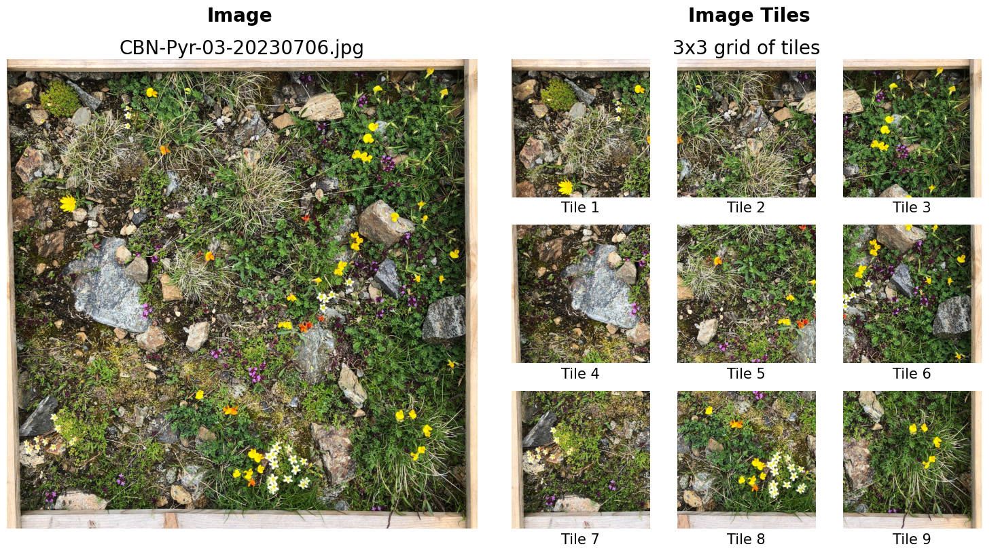

In [27]:
# show image tiles
plot_image_tiles(
    faiss_image_df,
    idx=0,
    path_col="image_path",
    grid_size=3,
)

In [ ]:
"/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/competition-metadata/PlantCLEF2025_test_images/PlantCLEF2025_test_images/CBN-Pyr-03-20230706.jpg"

/teamspace/studios/this_studio/plantclef-vision/data/plantclef2025/competition-metadata/PlantCLEF2025_test_images/CBN-Pyr-03-20230706.jpg'

### Visualizing Faiss predictions

We display the top Faiss-predicted species for each tile using both:
- Training reference images
- Predicted species labels

This allows us to assess prediction quality and inspect visual matches.

In [28]:
faiss_image_df.head(5)

,image_name,embeddings,logits,tile,image_path,predictions,similarities,pred_species_ids
13014,CBN-Pyr-03-20230706.jpg,"[1.1654399633407593, -1.2030222415924072, -0.5...","{'1355869': None, '1355873': None, '1355880': ...",0,/teamspace/studios/this_studio/plantclef-visio...,"[64402d79809b7a71af26dc246891a6bef71f2a7b.jpg,...","[0.42543497681617737, 0.38580042123794556, 0.3...","[1394866, 1398765, 1362410, 1396030, 1396030]"
13015,CBN-Pyr-03-20230706.jpg,"[1.902640700340271, 0.1802995204925537, 0.3948...","{'1355869': None, '1355873': None, '1355880': ...",1,/teamspace/studios/this_studio/plantclef-visio...,"[3fff4ce42cb4b664f2662511de82616e3f9880b0.jpg,...","[0.4670138359069824, 0.41895103454589844, 0.41...","[1390793, 1390899, 1394655, 1361275, 1396030]"
13016,CBN-Pyr-03-20230706.jpg,"[0.754167377948761, 0.05789295211434364, -0.39...","{'1355869': None, '1355873': None, '1355880': ...",2,/teamspace/studios/this_studio/plantclef-visio...,"[52d5a7b0310c0eaea4b75dc4b0e0eedbe1f5eb92.jpg,...","[0.38883212208747864, 0.3711889982223511, 0.36...","[1396030, 1396030, 1396030, 1396272, 1394866]"
13017,CBN-Pyr-03-20230706.jpg,"[0.45846202969551086, -0.3378230035305023, 0.3...","{'1355869': None, '1355873': None, '1355880': ...",3,/teamspace/studios/this_studio/plantclef-visio...,"[f4ea061e3f732a10046593d30b6e0a680439cb52.jpg,...","[0.5094369053840637, 0.49019336700439453, 0.48...","[1394272, 1396030, 1396272, 1396030, 1396030]"
13018,CBN-Pyr-03-20230706.jpg,"[0.6989939212799072, 0.04056354984641075, -0.1...","{'1355869': None, '1355873': None, '1355880': ...",4,/teamspace/studios/this_studio/plantclef-visio...,"[48cfd8d9a6677da0729f792f15d55f75bd0966ac.jpg,...","[0.4351121187210083, 0.4229680299758911, 0.414...","[1396030, 1396272, 1359036, 1396272, 1396030]"


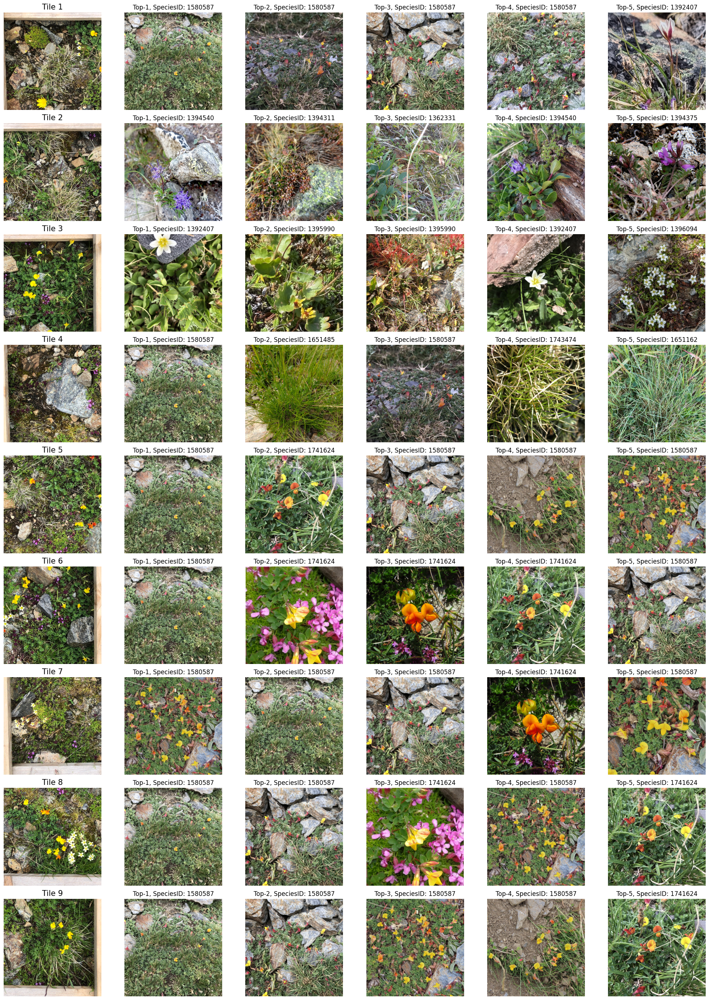

In [12]:
from plantclef.plotting import plot_faiss_classifications

# plot tiles and image classifications from faiss
plot_faiss_classifications(
    train_df,
    faiss_image_df,
    grid_size=3,
    figsize=(20, 30),
)

### How Faiss-based classification works

We're using Faiss to perform ***K*-Nearest Neighbor Search** on image embeddings.
- Faiss finds the top-*K* training embeddings most similar to each test tile.
- Each training image has a single `species_id`.
- By mapping predictions back to species, we achieve multi-label classification without any training.

This strategy leverages the power of **transfer learning + visual similarity** for inference.

In [13]:
# images names predicted in the first tile
img_names = faiss_image_df.predictions.iloc[0]
# species_ids of predictions
preds = faiss_image_df["pred_species_ids"].iloc[0]

for i, name in enumerate(img_names):
    print(f"{name}: {preds[i]}")

24b0ad4bb85c03456f33d341b6c811c9d94f889f.jpg: 1580587
682392ca1c3e459ce1d7945a9249ef69811731fe.jpg: 1580587
a5d2625e62b433dd07a224abd60e76e51f89777d.jpg: 1580587
60f0d09accf8ec2cc6edbc2796aea8d88b7ec221.jpg: 1580587
3cb685efd80e76a3e76aea57130c646996f3fcf5.jpg: 1392407


### Creating submission CSV

We generate a submission file in the required format for the PlantCLEF 2025 competition.  
Each record includes a plot ID and the predicted species IDs aggregated from tile-level predictions.

**Note:** This submisison DataFrame is missing many test images because we're using a subset of the test set with 200 images. The real test set for the 2025 competition has **2,105 images**.

In [14]:
from plantclef.config import create_submission_csv

# create submission file
submission_df = create_submission_csv(faiss_df, save_csv=True)
submission_df.head(10)

Submission file saved to: ../data/submission/submission.csv


,quadrat_id,species_ids
0,CBN-PdlC-A2-20140721.jpg,"[1395974, 1412857, 1392323, 1393659, 1396869, ..."
1,CBN-PdlC-A2-20160726.jpg,"[1395974, 1393659, 1393824, 1396869, 1395807, ..."
2,CBN-PdlC-A2-20190701.jpg,"[1395974, 1392323, 1393314, 1390793, 1396857, ..."
3,CBN-PdlC-A2-20200812.jpg,"[1395974, 1393659, 1393314, 1397468, 1390846, ..."
4,CBN-PdlC-A3-20140901.jpg,"[1412857, 1742053, 1394311, 1395974, 1393314, ..."
5,CBN-PdlC-A3-20150810.jpg,"[1412857, 1742052, 1742053, 1393314, 1743474, ..."
6,CBN-PdlC-A3-20160705.jpg,"[1412857, 1393619, 1392407, 1393314, 1391331, ..."
7,CBN-PdlC-A3-20160726.jpg,"[1412857, 1395974, 1549015, 1393659, 1742053, ..."
8,CBN-PdlC-A3-20180815.jpg,"[1393659, 1412857, 1394311, 1742053, 1393314, ..."
9,CBN-PdlC-A3-20190722.jpg,"[1412857, 1742053, 1393659, 1395974, 1742052, ..."
